<a href="https://colab.research.google.com/github/nimishvaradkar/Codebot/blob/main/Task4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Analyze and visualize sentiment pattern in social media data to understand people opition and attitude towards specific topics or brands.

In [ ]:
# Install required libraries (if not already installed)
!pip install -q pandas matplotlib seaborn nltk wordcloud scikit-learn

# Import libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

# Download NLTK resources
nltk.download('stopwords')




[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
from google.colab import files
uploaded = files.upload()

# After upload, load the dataset (replace with actual filename)
df = pd.read_csv('twitter_training.csv', header=None, names=["entity", "sentiment", "tweet_id", "text"])
df.head()


Saving twitter_training.csv to twitter_training (1).csv


,entity,sentiment,tweet_id,text
0,2401,Borderlands,Positive,im getting on borderlands and i will murder yo...
1,2401,Borderlands,Positive,I am coming to the borders and I will kill you...
2,2401,Borderlands,Positive,im getting on borderlands and i will kill you ...
3,2401,Borderlands,Positive,im coming on borderlands and i will murder you...
4,2401,Borderlands,Positive,im getting on borderlands 2 and i will murder ...


In [ ]:
def clean_text(text):
    if pd.isnull(text):
        return ""
    text = str(text)
    text = re.sub(r"http\S+|www\S+|https\S+", '', text, flags=re.MULTILINE)
    text = re.sub(r'\@\w+|\#','', text)
    text = re.sub(r'[^A-Za-z\s]', '', text)
    text = text.lower()
    return text

df['clean_text'] = df['text'].apply(clean_text)
df.head()


,entity,sentiment,tweet_id,text,clean_text
0,2401,Borderlands,Positive,im getting on borderlands and i will murder yo...,im getting on borderlands and i will murder yo...
1,2401,Borderlands,Positive,I am coming to the borders and I will kill you...,i am coming to the borders and i will kill you...
2,2401,Borderlands,Positive,im getting on borderlands and i will kill you ...,im getting on borderlands and i will kill you all
3,2401,Borderlands,Positive,im coming on borderlands and i will murder you...,im coming on borderlands and i will murder you...
4,2401,Borderlands,Positive,im getting on borderlands 2 and i will murder ...,im getting on borderlands and i will murder y...


<ipython-input-5-9f10ff62292b>:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='sentiment', palette='Set2')


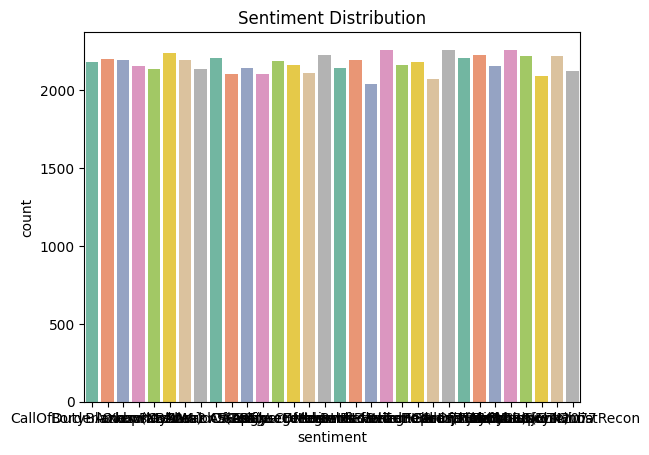

In [ ]:
sns.countplot(data=df, x='sentiment', palette='Set2')
plt.title('Sentiment Distribution')
plt.show()


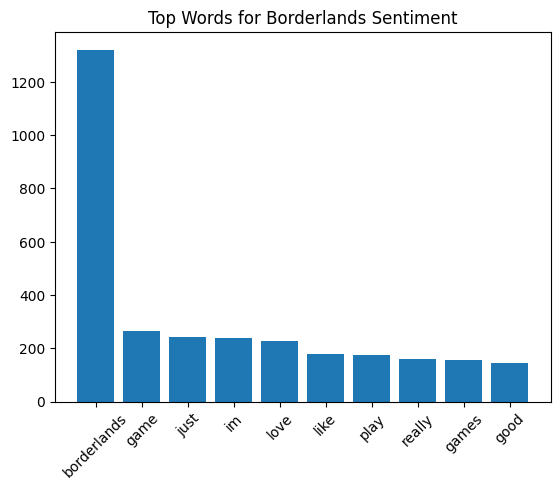

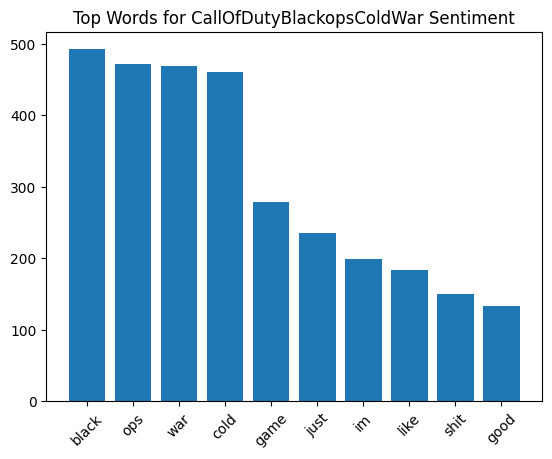

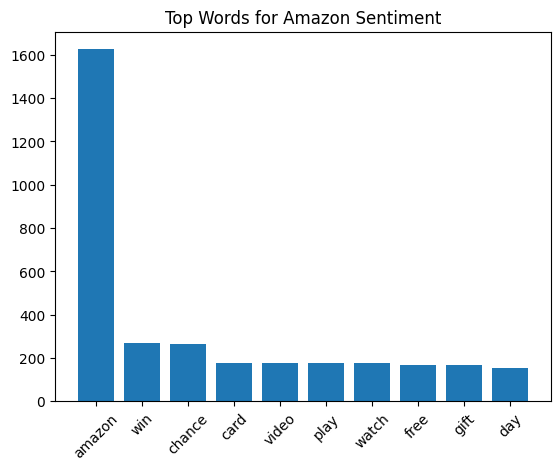

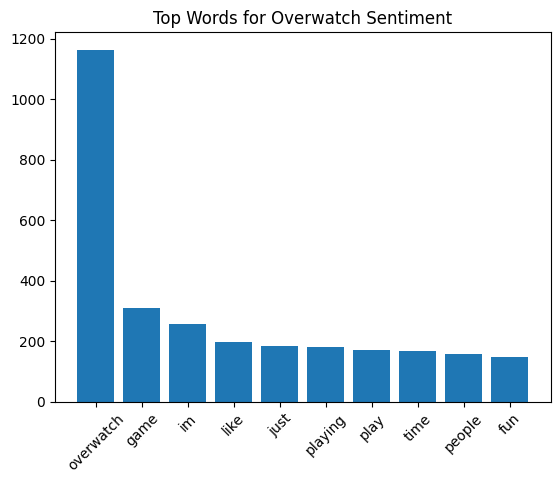

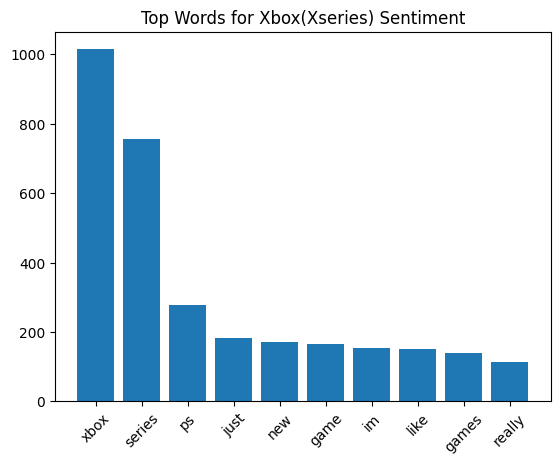

...

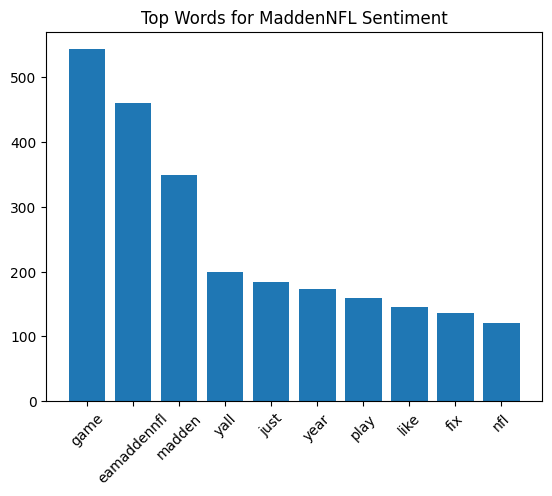

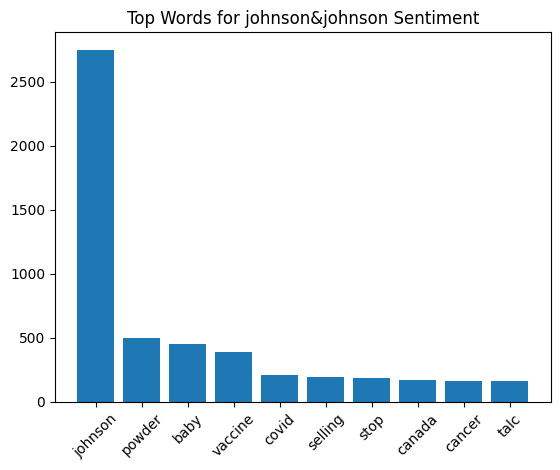

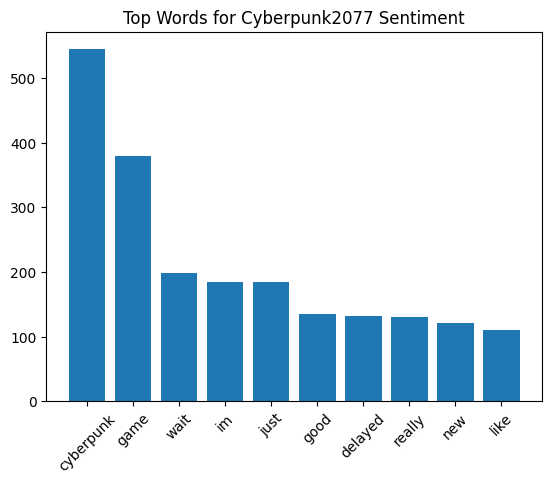

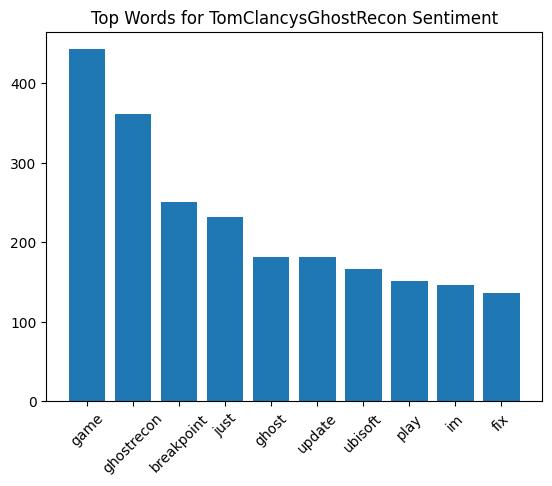

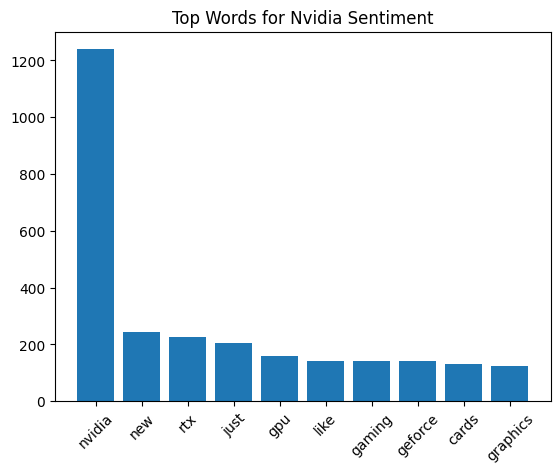

In [ ]:
from collections import Counter

def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    return sorted(words_freq, key = lambda x: x[1], reverse=True)[:n]

for sentiment in df['sentiment'].unique():
    top_words = get_top_n_words(df[df['sentiment'] == sentiment]['clean_text'], 10)
    words, counts = zip(*top_words)
    plt.bar(words, counts)
    plt.title(f"Top Words for {sentiment} Sentiment")
    plt.xticks(rotation=45)
    plt.show()


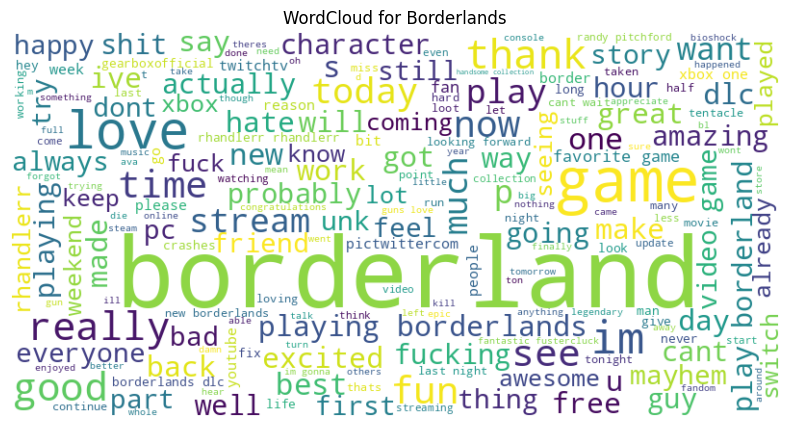

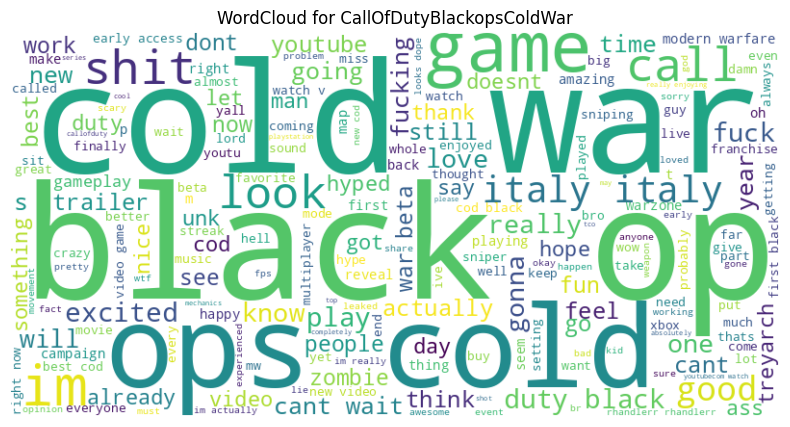

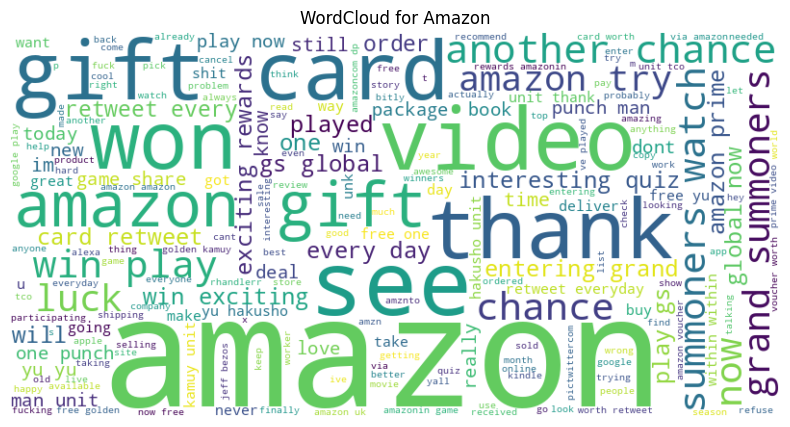

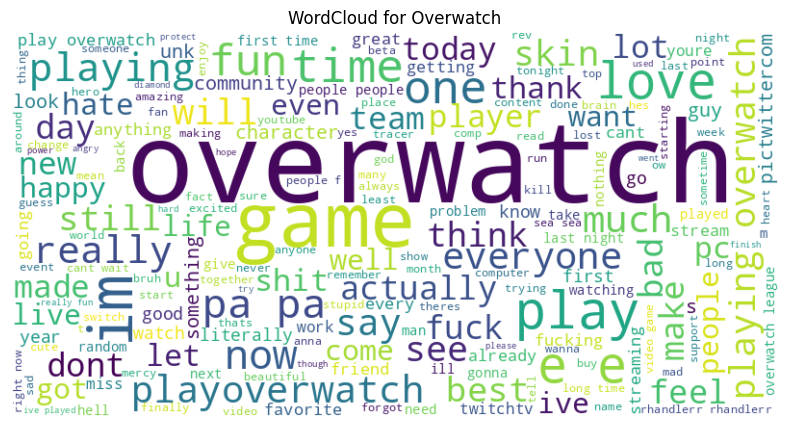

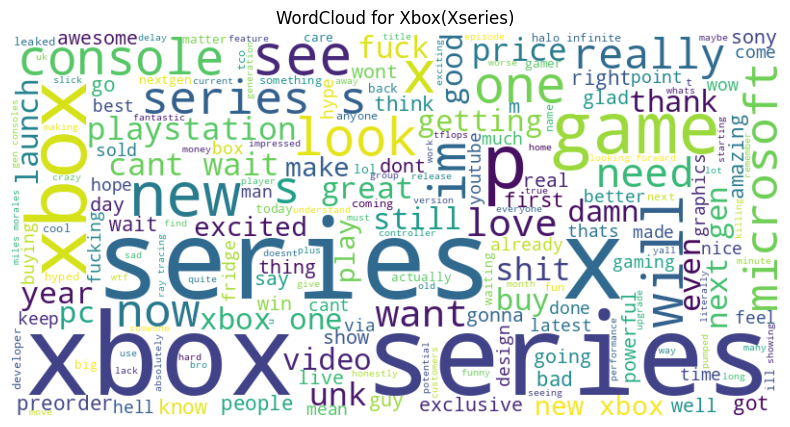

...

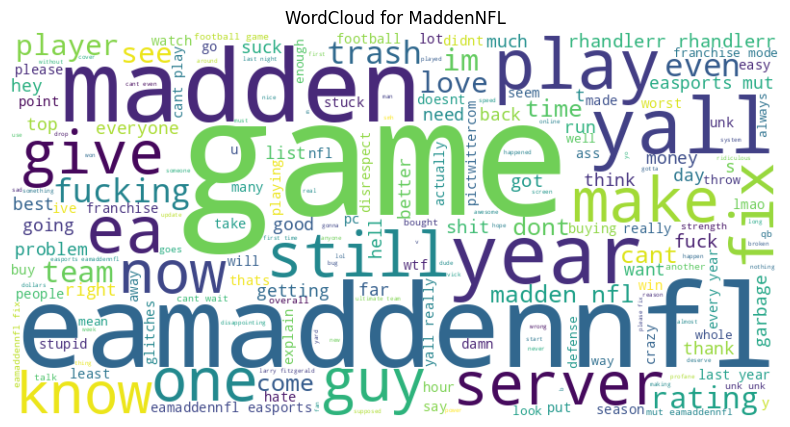

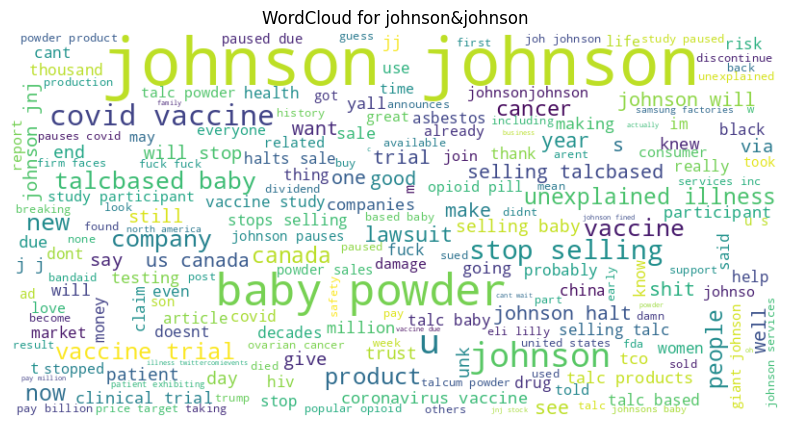

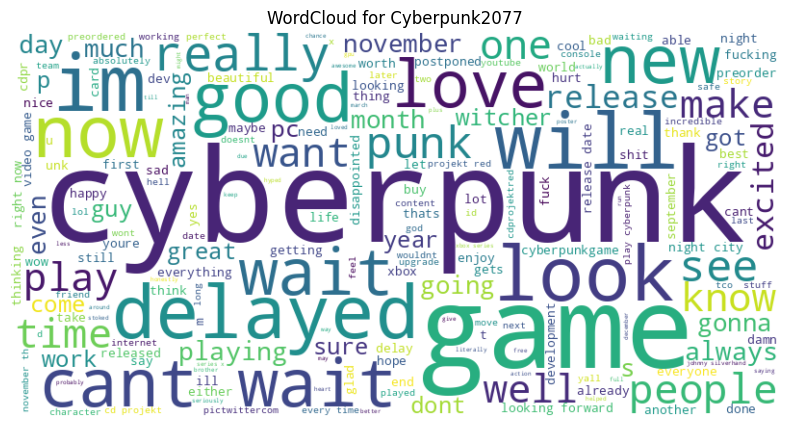

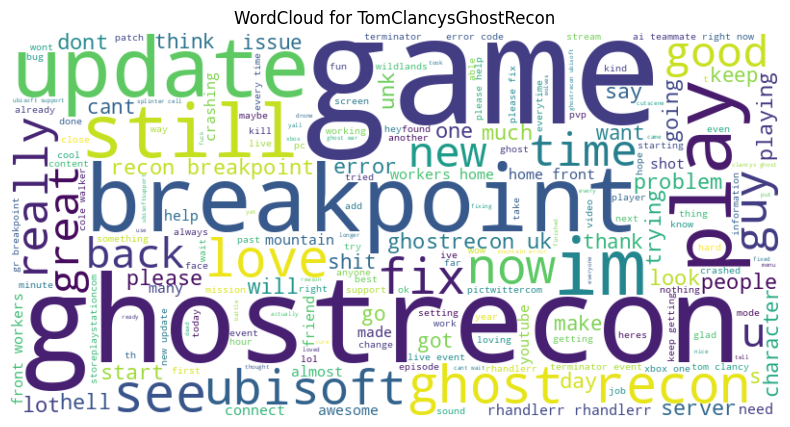

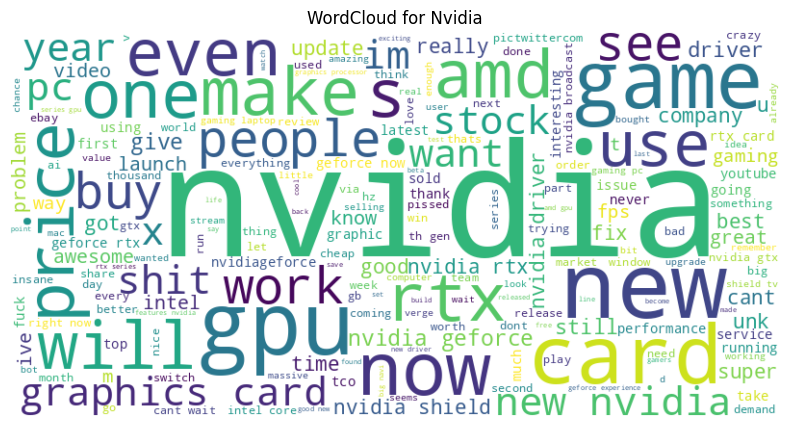

In [ ]:
for sentiment in df['sentiment'].unique():
    text = ' '.join(df[df['sentiment'] == sentiment]['clean_text'])
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"WordCloud for {sentiment}")
    plt.show()


In [ ]:
model = LogisticRegression(max_iter=200, solver='liblinear')
model = LogisticRegression(max_iter=200, solver='liblinear', verbose=1)


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

# Convert text to bag-of-words
vectorizer = CountVectorizer(stop_words='english')
X = vectorizer.fit_transform(df['clean_text'])
y = df['sentiment']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train logistic regression model with better solver
model = LogisticRegression(max_iter=200, solver='liblinear', verbose=1)
model.fit(X_train, y_train)

# Predict and evaluate
y_pred = model.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


[LibLinear][[401   2   2 ...   1   1   0]
 [  1 355   0 ...   3   5   0]
 [  0   5 350 ...   1   7   0]
 ...
 [  0   1   2 ... 374   6   0]
 [  0   2   0 ...   2 338   2]
 [  0   3   1 ...   0   0 446]]
                                   precision    recall  f1-score   support

                           Amazon       0.96      0.93      0.94       433
                      ApexLegends       0.77      0.79      0.78       447
                   AssassinsCreed       0.87      0.82      0.84       426
                      Battlefield       0.93      0.85      0.89       442
                      Borderlands       0.95      0.87      0.91       436
                            CS-GO       0.91      0.75      0.82       399
                       CallOfDuty       0.84      0.79      0.81       459
        CallOfDutyBlackopsColdWar       0.47      0.79      0.59       423
                    Cyberpunk2077       0.73      0.76      0.74       402
                            Dota2       0.70  

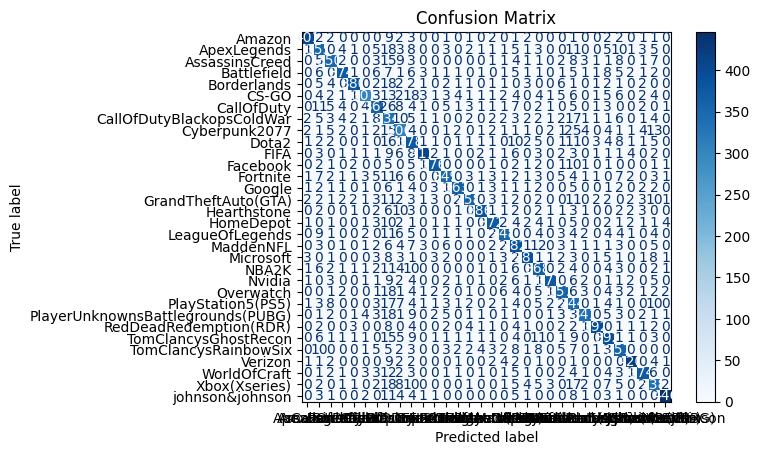

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay

ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, cmap='Blues')
plt.title("Confusion Matrix")
plt.show()
